In [139]:
import pyfits
import glob
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
from astropy.io import fits
import scipy.ndimage as snd
import scipy
%matplotlib inline

[ '/Users/noahknoblauch/PHY157/Observing/2016-Spring_157/20160526/Bias/Bias.00000001.BIAS.FIT'
 '/Users/noahknoblauch/PHY157/Observing/2016-Spring_157/20160526/Bias/Bias.00000002.BIAS.FIT'
 '/Users/noahknoblauch/PHY157/Observing/2016-Spring_157/20160526/Bias/Bias.00000003.BIAS.FIT'
 '/Users/noahknoblauch/PHY157/Observing/2016-Spring_157/20160526/Bias/Bias.00000004.BIAS.FIT'
 '/Users/noahknoblauch/PHY157/Observing/2016-Spring_157/20160526/Bias/Bias.00000005.BIAS.FIT'] ... [ '/Users/noahknoblauch/PHY157/Observing/2016-Spring_157/20160526/M81/M81.00000005.M_81.FIT'
 '/Users/noahknoblauch/PHY157/Observing/2016-Spring_157/20160526/mars/mars.00000006.Mars.FIT'
 '/Users/noahknoblauch/PHY157/Observing/2016-Spring_157/20160526/mars/mars.00000007.Mars.FIT'
 '/Users/noahknoblauch/PHY157/Observing/2016-Spring_157/20160526/mars/mars.00000008.Mars.FIT'
 '/Users/noahknoblauch/PHY157/Observing/2016-Spring_157/20160526/mars/mars.00000009.Mars.FIT']
Our exposure types ['Bias Frame' 'Dark Frame' 'Light F

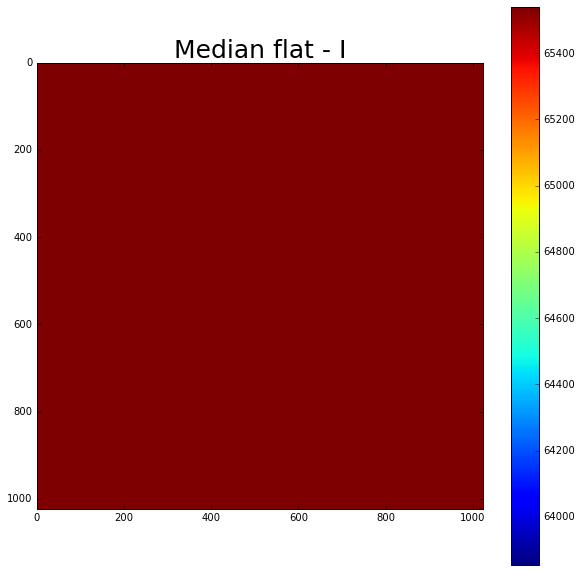

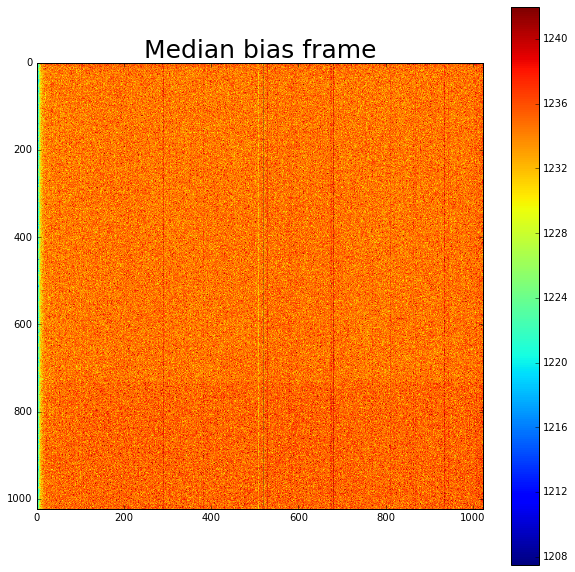

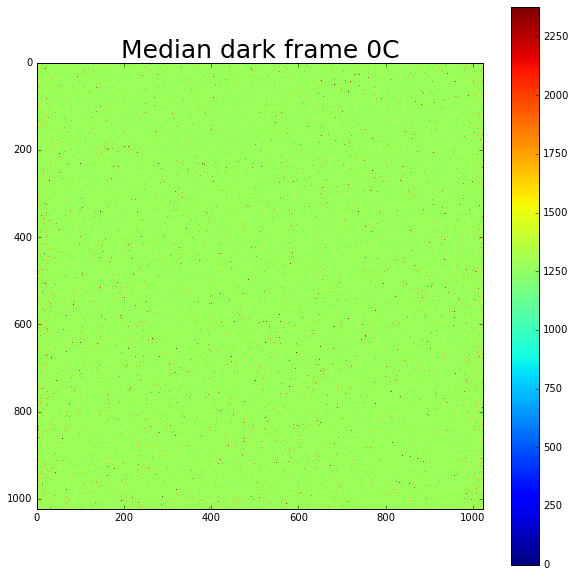

In [142]:
"""
Fit files from 2016

Using getheader to differenciate filetypes

"""

rootdir='/Users/noahknoblauch/PHY157/Observing/2016-Spring_157/20160526/'
all_fits_filenames=np.array(glob.glob(rootdir+'*/*.FIT'))
print all_fits_filenames[:5],"...",all_fits_filenames[-5:]

all_exp_types = np.array([pyfits.getheader(fooname)["IMAGETYP"] for fooname in all_fits_filenames])
print "Our exposure types",np.unique(all_exp_types)

light_filenames = all_fits_filenames[np.where(all_exp_types=='Light Frame')]
light_folders = np.array([fooname.split('/')[-2] for fooname in light_filenames])

bias_filenames = all_fits_filenames[np.where(all_exp_types=='Bias Frame')]
print "Number of bias frames",len(bias_filenames)

dark_filenames = np.sort(all_fits_filenames[np.where(all_exp_types=='Dark Frame')])
dark_exptimes=np.array([pyfits.getheader(fooname)["EXPTIME"] for fooname in dark_filenames])
dark_temperature=np.array([pyfits.getheader(fooname)["CCD-TEMP"] for fooname in dark_filenames])
print "Number of darks and exposure times",str(len(dark_filenames)),(dark_exptimes)
print "Temperatures",str(len(dark_filenames)),np.unique(dark_temperature)

flat_filenames = light_filenames[np.where(light_folders=='FLATS')]
flat_filter_names=np.array([pyfits.getheader(fooname)["FILTER"] for fooname in flat_filenames])
flat_exptimes=np.array([pyfits.getheader(fooname)["EXPTIME"] for fooname in flat_filenames])
print "Flat filters and exposure times",np.unique(flat_filter_names),(flat_exptimes)

light_filenames = all_fits_filenames[np.where(all_exp_types=='Light Frame')]
light_folders = np.array([fooname.split('/')[-2] for fooname in light_filenames])

m51_filenames=light_filenames[np.where(light_folders=='M51')]

m51_filter_names=np.array([pyfits.getheader(fooname)["FILTER"] for fooname in m51_filenames])
m51_exptimes=np.array([pyfits.getheader(fooname)["EXPTIME"] for fooname in m51_filenames])
print "M51 filters exposed and exposure times",np.unique(m51_filter_names),np.unique(m51_exptimes)

M51_temperature=np.array([pyfits.getheader(fooname)["CCD-TEMP"] for fooname in m51_filenames])
print "Temperatures",str(len(m51_filenames)),np.unique(M51_temperature)
""""
Median Function & Images of Flats, Bias, and  Darks

"""

def median_combine(filelist):
    allimgs=[]
    for filename in filelist: allimgs.append(pyfits.getdata(filename))
    allimgs=np.array(allimgs)
    medianimg=np.median(allimgs,axis=0)
    return medianimg


thefilt='I'
flat_time=15
dark_time=100


median_dark=median_combine(dark_filenames[:][np.where((dark_exptimes==dark_time))])

median_flat=median_combine(flat_filenames[np.where((flat_filter_names==thefilt) & 
                                                             (flat_exptimes==flat_time))])
median_bias=median_combine(bias_filenames[:50])   # note that I take only the first 50 biases, to save time


print "B Flat:",len(flat_filenames[np.where((flat_filter_names==thefilt) & 
                                                             (flat_exptimes==flat_time))])

plt.figure(figsize=(10,10))
plt.imshow(median_flat,vmax=np.median(median_flat)+3*np.std(median_flat))
plt.title('Median flat - '+thefilt,fontsize=25)
plt.colorbar()

plt.figure(figsize=(10,10))
plt.imshow(median_bias,vmax=np.median(median_bias)+3*np.std(median_bias))
plt.title('Median bias frame',fontsize=25)
plt.colorbar()

plt.figure(figsize=(10,10))
plt.imshow(median_dark,vmax=np.median(median_dark)+3*np.std(median_dark))
plt.title('Median dark frame 0C',fontsize=25)
plt.colorbar()


In [141]:
def reduce_raw_science_frames(science_filelist,median_bias,median_flat,median_dark):
    allreducedimgs=[]
    normed_flat=(median_flat-median_bias)/np.median(median_flat-median_bias)
    for filename in science_filelist: 
        science_frame=pyfits.getdata(filename)
        reduced_frame=(science_frame-median_dark)/normed_flat
        allreducedimgs.append(reduced_frame)
    allreducedimgs=np.array(allreducedimgs)
    return allreducedimgs

[ '/Users/noahknoblauch/PHY157/Observing/2016-Spring_157/20160526/M51/B_band.00000018.M_51.FIT'
 '/Users/noahknoblauch/PHY157/Observing/2016-Spring_157/20160526/M51/B_band.00000019.M_51.FIT'
 '/Users/noahknoblauch/PHY157/Observing/2016-Spring_157/20160526/M51/B_band.00000020.M_51.FIT'
 '/Users/noahknoblauch/PHY157/Observing/2016-Spring_157/20160526/M51/B_band.00000021.M_51.FIT'
 '/Users/noahknoblauch/PHY157/Observing/2016-Spring_157/20160526/M51/B_band.00000022.M_51.FIT'
 '/Users/noahknoblauch/PHY157/Observing/2016-Spring_157/20160526/M51/B_band.00000023.M_51.FIT'
 '/Users/noahknoblauch/PHY157/Observing/2016-Spring_157/20160526/M51/B_band.00000024.M_51.FIT'
 '/Users/noahknoblauch/PHY157/Observing/2016-Spring_157/20160526/M51/B_band.00000025.M_51.FIT'
 '/Users/noahknoblauch/PHY157/Observing/2016-Spring_157/20160526/M51/B_band.00000026.M_51.FIT'
 '/Users/noahknoblauch/PHY157/Observing/2016-Spring_157/20160526/M51/B_band.00000027.M_51.FIT'
 '/Users/noahknoblauch/PHY157/Observing/2016-Spri

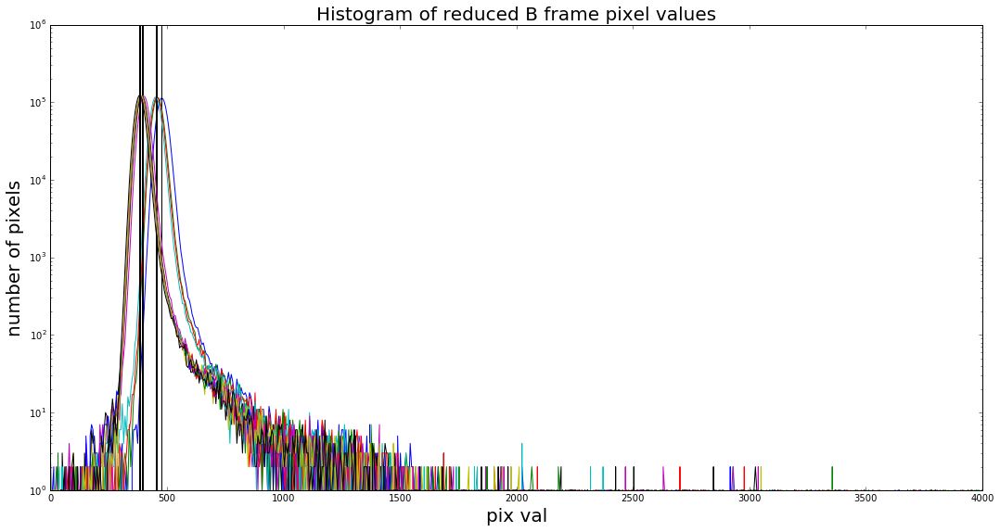

In [66]:
m51_time=100
science_filenames=np.sort(m51_filenames[np.where((m51_filter_names==thefilt) & (m51_exptimes==m51_time))])[1:]
science_filenames=science_filenames
print science_filenames
science_reduced = reduce_raw_science_frames(science_filenames,median_bias,median_flat,median_dark)
science_exptimes=np.array([pyfits.getheader(fooname)["EXPTIME"] for fooname in science_filenames])
print science_exptimes
for i in range(len(science_reduced)):
    pyfits.writeto(science_filenames[i].split('.FIT')[0]+'-reduced.fits',science_reduced[i],
                   clobber=True,header=pyfits.getheader(science_filenames[i]))

plt.figure(figsize=(18,9))
skylevels=[]
for i in range(len(science_reduced)):
    numpix,aduvals=np.histogram(science_reduced[i].flatten(),bins=1000,range=[-1000,5e3])
    skylevel=aduvals[np.where(numpix==numpix.max())][0]
    skylevels.append(skylevel)
    plt.plot(aduvals[:-1],numpix)
    plt.axvline(skylevel,color='k')
plt.xlabel('pix val',fontsize=20)
plt.ylabel('number of pixels',fontsize=20)
plt.yscale('log')

plt.xlim(0,4000)

print skylevels
plt.title('Histogram of reduced B frame pixel values',fontsize=20)





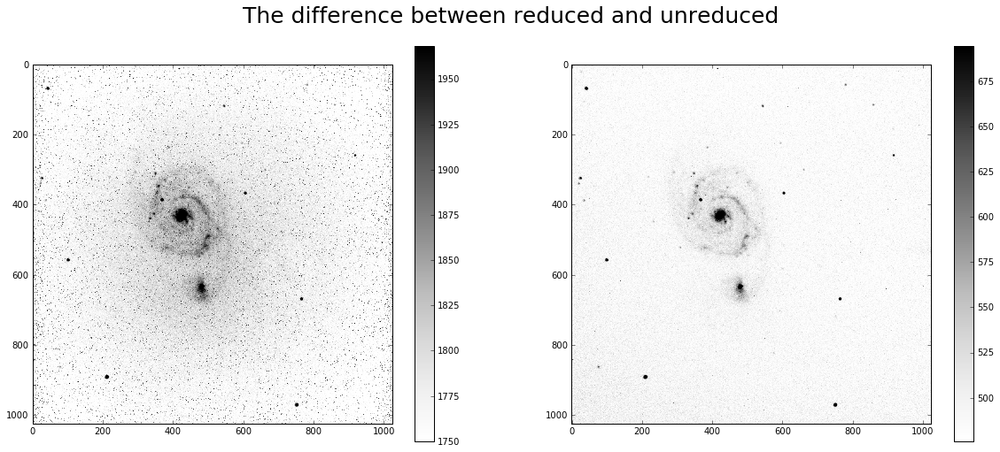

In [67]:
testnum=0
nstd=10
unreduced=pyfits.getdata(science_filenames[testnum])
plt.figure(figsize=(20,8))
plt.subplot(121)
vmin_unred=np.median(median_dark)+skylevels[testnum]
plt.imshow(unreduced,cmap='Greys',vmin=vmin_unred,vmax=vmin_unred+nstd*np.sqrt(skylevels[testnum]))
plt.colorbar()
plt.subplot(122)
plt.imshow(science_reduced[testnum],cmap='Greys',vmin=skylevels[testnum],vmax=skylevels[testnum]+nstd*np.sqrt(skylevels[testnum]))
plt.colorbar()
plt.suptitle('The difference between reduced and unreduced',fontsize=25)


In [68]:
def find_object_centroids_filterbysize(img,threshold,minsize):
    labels, num = snd.label(img > threshold, np.ones((3,3)))     # scipy labels/segments the image using a threshold
    centers = snd.center_of_mass(img, labels, range(1,num+1))    # scipy calculates the center of mass on the labeled img
    x = np.array(centers)[:,1]
    y = np.array(centers)[:,0]
    slices=snd.find_objects(labels)
    xs=np.array([objlabel[1].stop-objlabel[1].start for objlabel in slices])  # takes the min and max label slices
    ys=np.array([objlabel[0].stop-objlabel[0].start for objlabel in slices])  #  to find a rough object size

    maxsize=20    # I hardcoded this in so that some spurious objects would be skipped. Change/delete if you like
    bigenough=np.where((xs>minsize) & (ys>minsize) & (xs<maxsize) & (ys<maxsize))
    xc,yc=x[bigenough],y[bigenough]
    xs,ys=xs[bigenough],ys[bigenough]
    
    print str(len(xc))+' objects found'
    return xc,yc,xs,ys

28 objects found


[0, 1024, 0, 1024]

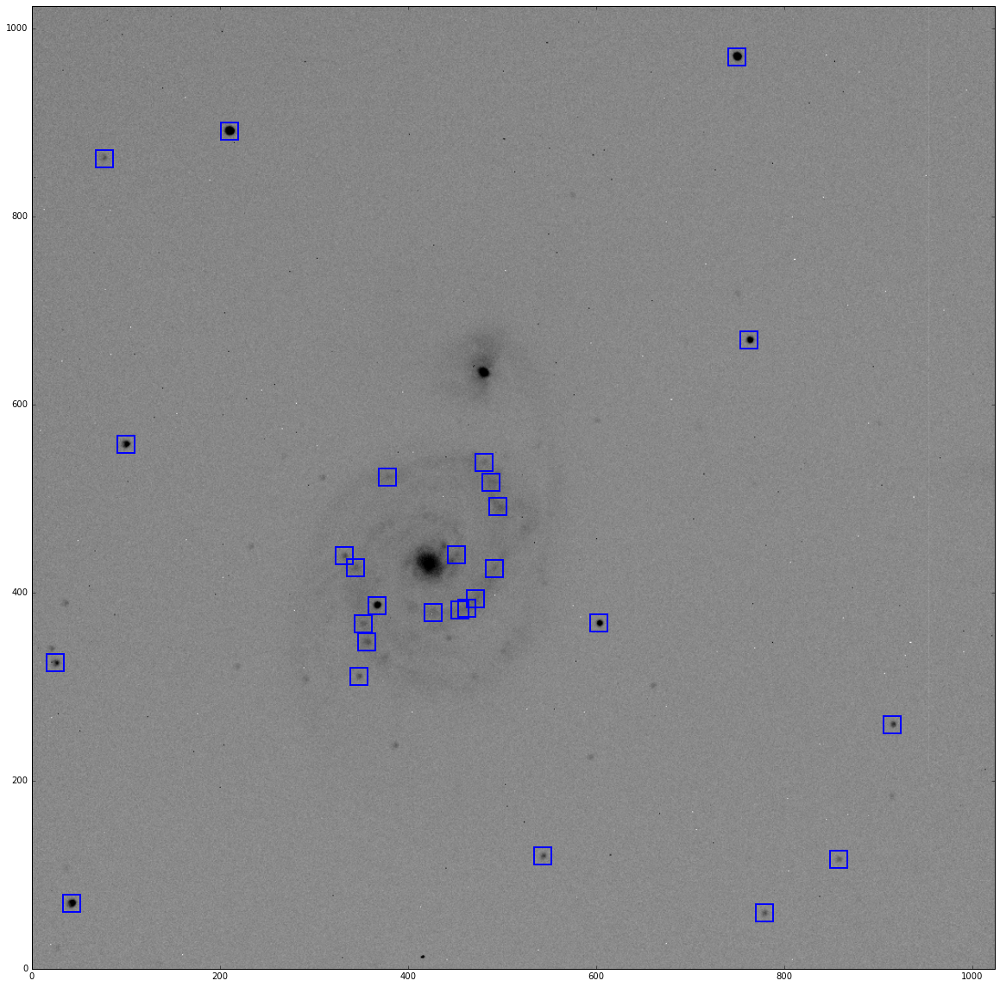

In [69]:
imgnum=0
nstd_aboveskynoise=5
threshold=skylevels[imgnum]+nstd_aboveskynoise*np.sqrt(skylevels[imgnum])   # decide on a threshold using the sky noise
minsize=3

xfoo,yfoo,xsfoo,ysfoo=find_object_centroids_filterbysize(science_reduced[imgnum],threshold,minsize)


plt.figure(figsize=(20,20))
plt.imshow(science_reduced[imgnum],cmap='Greys',vmin=0,vmax=1.5*threshold)
plt.plot(xfoo,yfoo,'rs',mfc='None',markersize=20,markeredgecolor='b',markeredgewidth=2)
plt.axis([0,1024,0,1024])

42 objects found
45 objects found
46 objects found
44 objects found
59 objects found
57 objects found
60 objects found
57 objects found
48 objects found
63 objects found
60 objects found
58 objects found
55 objects found
58 objects found


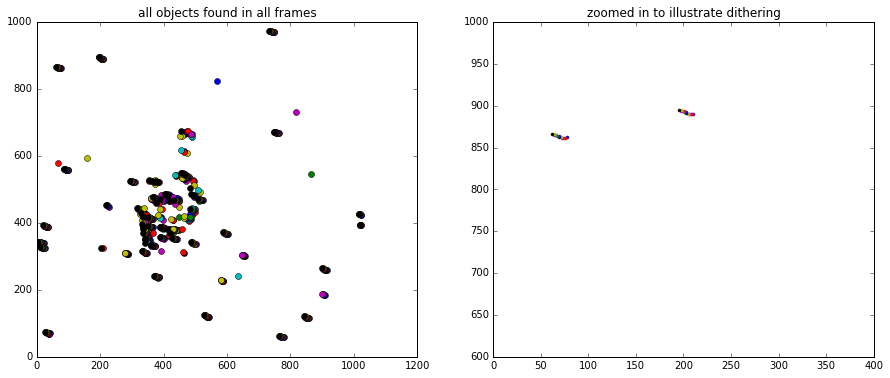

In [70]:
nstd_aboveskynoise=4
thresholds=skylevels+nstd_aboveskynoise*np.sqrt(skylevels)

#thresholds=[threshold]*len(science_reduced)
minsize=3
xc_all,yc_all,xs_all,ys_all=[],[],[],[]
plt.figure(figsize=(15,6))
for i in range(len(science_reduced)):
    xfoo,yfoo,xsfoo,ysfoo=find_object_centroids_filterbysize(science_reduced[i],thresholds[i],minsize)
    xc_all.append(xfoo)
    yc_all.append(yfoo)
    xs_all.append(xsfoo)
    ys_all.append(ysfoo)
    plt.subplot(121)
    plt.plot(xfoo,yfoo,'o')
    plt.subplot(122)
    plt.plot(xfoo,yfoo,'.')
    plt.axis([0,400,600,1000])
plt.subplot(121)
plt.title('all objects found in all frames')
plt.subplot(122)
plt.title('zoomed in to illustrate dithering')

In [71]:
def find_closest(xc0,yc0,xc1,yc1,dr):
    nobjs1=len(xc1)
    x_off,y_off=[],[]
    for i in range(nobjs1):
        poss_match=np.where(np.sqrt((xc1[i]-xc0)**2+(yc1[i]-yc0)**2)<dr)[0]  # for each object in the second catalog, 
        x_off.extend([(xc1[i]-xc0[j]) for j in poss_match])                  #  find matches within a radius dr
        y_off.extend([(yc1[i]-yc0[j]) for j in poss_match])
    x_off=np.array(x_off)
    y_off=np.array(y_off)
    
    n_xoff,xfoo=np.histogram(x_off,bins=dr*2,range=[-dr,dr])   # histogram all the offsets to find the maximum value
    n_yoff,yfoo=np.histogram(y_off,bins=dr*2,range=[-dr,dr])   #  which corresponds to the rough offset between frames
    x_peak=(xfoo[np.where(n_xoff==np.max(n_xoff))])[0]+(xfoo[1]-xfoo[0])/2.
    y_peak=(yfoo[np.where(n_yoff==np.max(n_yoff))])[0]+(yfoo[1]-yfoo[0])/2.   # (note addition of half bin width)
    return x_off,y_off,x_peak,y_peak


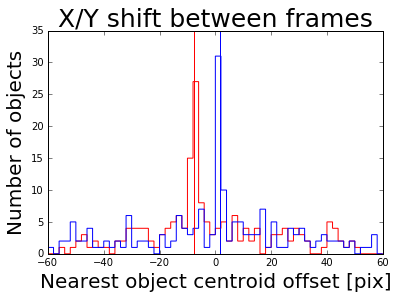

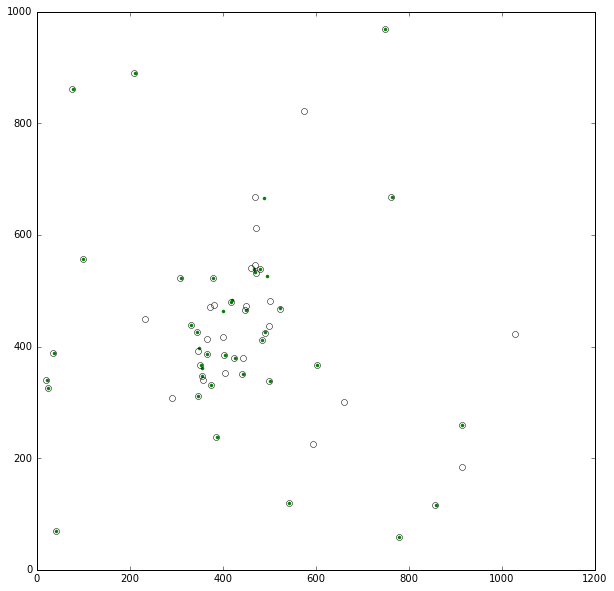

In [72]:
secondnum=7
dr=60
xc0,yc0,xc1,yc1=xc_all[0],yc_all[0],xc_all[secondnum],yc_all[secondnum]
xoff,yoff,xpeak,ypeak=find_closest(xc0,yc0,xc1,yc1,dr)
 
    
plt.hist(xoff,histtype='step',label='x offset',range=[-dr,dr],bins=dr,color='r')
plt.hist(yoff,histtype='step',label='y offset',range=[-dr,dr],bins=dr,color='b')

plt.axvline(xpeak,color='r')
plt.axvline(ypeak,color='b')

plt.xlabel('Nearest object centroid offset [pix]',fontsize=20)
plt.ylabel('Number of objects',fontsize=20)
plt.title('X/Y shift between frames',fontsize=25)

plt.figure(figsize=(10,10))
plt.plot(xc0,yc0,'g.')
plt.plot(xc1-xpeak,yc1-ypeak,'o',mfc='None')


In [73]:
def find_frame_shifts(x0,y0,x1,y1,dr0,nsteps):    #like the def above, take in two sets of coordinates
    xshifts,yshifts=0,0
    drs=[dr0,20,10,5,2.5,1.25]
    for i in range(nsteps):
        dr=dr0/(1.+i)      # slowly reduce the matching radius, to get rid of outliers
        xoff,yoff,xpeak,ypeak=find_closest(x0,y0,x1-xshifts,y1-yshifts,dr)
        n_xoff,xfoo=np.histogram(xoff,bins=50,range=[-dr,dr])
        n_yoff,yfoo=np.histogram(yoff,bins=50,range=[-dr,dr])
        #axvline(xpeak)
        #print xpeak
        if i==0:
            xshift,yshift=xpeak,ypeak    # the first rough offset estimate is the peak of the offset histogram
        else:                            # successive offsets are found by taking the median value of the remainder
            xshift,yshift=np.median(xoff[np.abs(xoff)<dr/2.]),np.median(yoff[np.abs(yoff)<dr/2.])
        xshifts+=xshift        # add in each successive offset to the total
        yshifts+=yshift
        print dr,xshifts,yshifts
        #plot(xshifts,yshifts,'o')
    plt.hist(xoff,histtype='step',color='r',bins=50)
    plt.hist(yoff,histtype='step',color='b',bins=50)
    #plot(yfoo[1:],n_yoff,'b')
    plt.axvline(xshift,color='r')
    plt.axvline(yshift,color='b')
    return xshifts,yshifts

60.0 -15.5 4.5
30.0 -15.3714629776 4.32039654524
20.0 -15.4004885786 4.23520357068
15.0 -15.3989358573 4.26229536041
12.0 -15.4020413 4.26734812229
10.0 -15.4004885786 4.26734812229


(-15.400488578642353, 4.267348122293491)

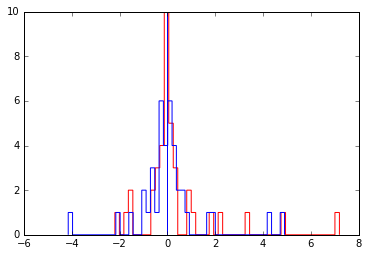

In [74]:
firstnum,secondnum=0,-1
dr=60
xc0,yc0,xc1,yc1=xc_all[firstnum],yc_all[firstnum],xc_all[secondnum],yc_all[secondnum]
find_frame_shifts(xc0,yc0,xc1,yc1,dr,6)

60.0 -2.5 -0.5
30.0 -2.41751317783 -0.079540619562
20.0 -2.47966188843 -0.0593913767411
15.0 -2.47966188843 -0.090094875145
60.0 -2.5 -0.5
30.0 -1.99889191132 -0.402886508849
20.0 -1.99546656097 -0.400628328273
15.0 -2.00818491884 -0.394928547316
60.0 -4.5 -0.5
30.0 -4.24303571852 -0.408134220027
20.0 -4.19115090439 -0.396899214014
15.0 -4.19115090439 -0.378004315508
60.0 -4.5 -0.5
30.0 -4.79395494994 -0.347853735769
20.0 -4.77077008491 -0.396895387027
15.0 -4.77875989623 -0.385741524795
60.0 -5.5 0.5
30.0 -5.18026528364 0.0862784359211
20.0 -5.12394850851 -0.0176863352786
15.0 -5.1570459062 -0.0641046173338
60.0 -7.5 0.5
30.0 -7.58120504605 0.376582872729
20.0 -7.53830712125 0.27014306753
15.0 -7.54371497982 0.235881448495
60.0 -7.5 1.5
30.0 -7.92373840071 1.67442347286
20.0 -7.95142801558 1.64102292368
15.0 -7.94009038509 1.6291046654
60.0 -10.5 2.5
30.0 -10.281243685 2.03256205771
20.0 -10.3173369923 2.03256205771
15.0 -10.3245183674 2.03256205771
60.0 -10.5 2.5
30.0 -10.4584337952 

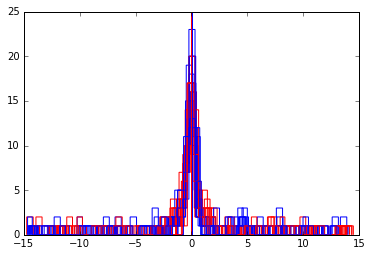

In [75]:
xshifts,yshifts=np.zeros(len(science_reduced)),np.zeros(len(science_reduced))
for secondnum in range(1,len(science_reduced)):
    xshifts[secondnum],yshifts[secondnum]=find_frame_shifts(xc_all[0],yc_all[0],xc_all[secondnum],yc_all[secondnum],dr,4)


In [76]:
science_shifted_rescaled=np.array([snd.interpolation.shift(science_reduced[i],[-yshifts[i],-xshifts[i]],order=5) for i in range(0,len(science_reduced))])
B_stackedimg=np.median(science_shifted_rescaled,axis=0)-np.median(skylevels)

//anaconda/lib/python2.7/site-packages/pyfits/file.py:372: UserWarning: Overwriting existing file '/Users/noahknoblauch/PHY157/Observing/2016-Spring_157/20160526/B-median.fits'.
  warnings.warn("Overwriting existing file %r." % self.name)


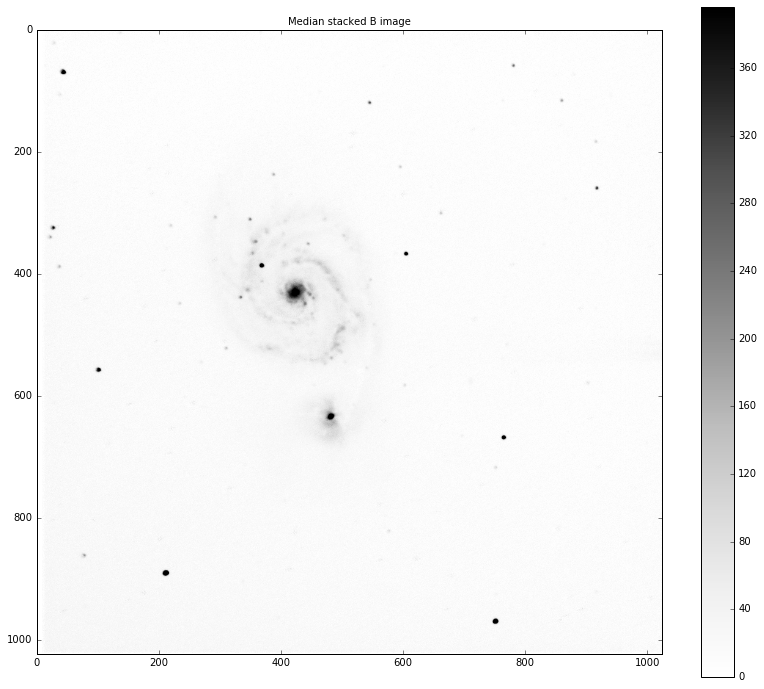

In [77]:
plt.figure(figsize=(14,12))
plt.title('Median stacked '+thefilt+' image',fontsize=10)
plt.imshow(B_stackedimg,cmap='Greys',vmin=0,vmax=20*np.sqrt(np.median(skylevels)))
plt.colorbar()
#plt.axis([200,700,200,700])
pyfits.writeto(rootdir+thefilt+'-median.fits',B_stackedimg,clobber=True)

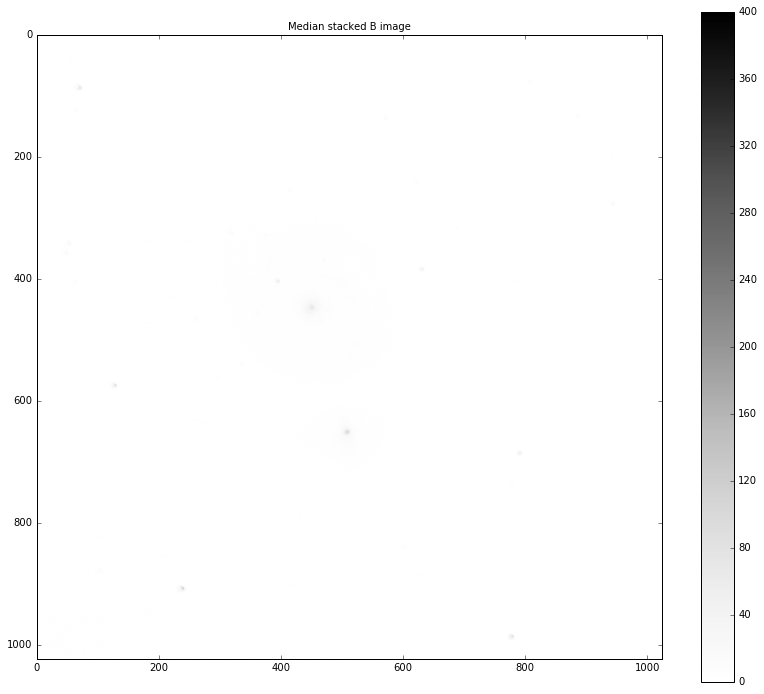

[[ 21227.  22610.  22752. ...,  23152.  23194.  21543.]
 [ 24884.  27016.  26887. ...,  27659.  27558.  25498.]
 [ 24914.  26889.  27124. ...,  27766.  27710.  25500.]
 ..., 
 [ 24474.  26500.  26440. ...,  26675.  26590.  24480.]
 [ 24488.  26554.  26554. ...,  26631.  26540.  24412.]
 [ 23608.  25194.  25326. ...,  25536.  25562.  23520.]]


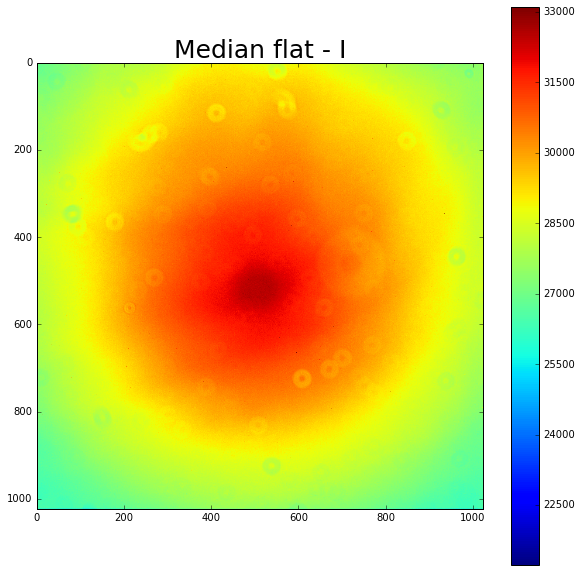

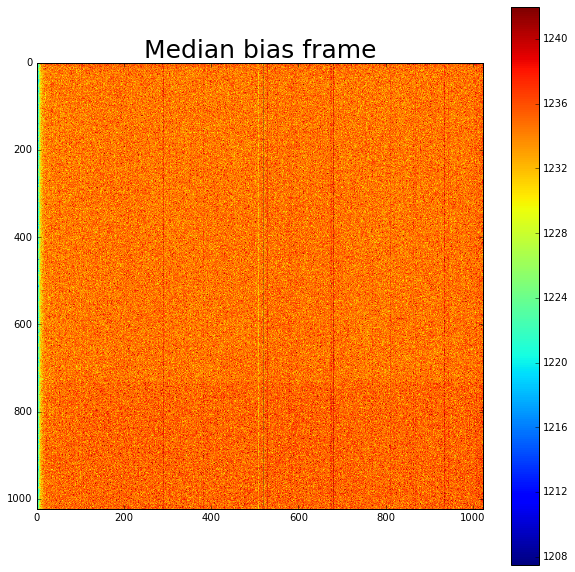

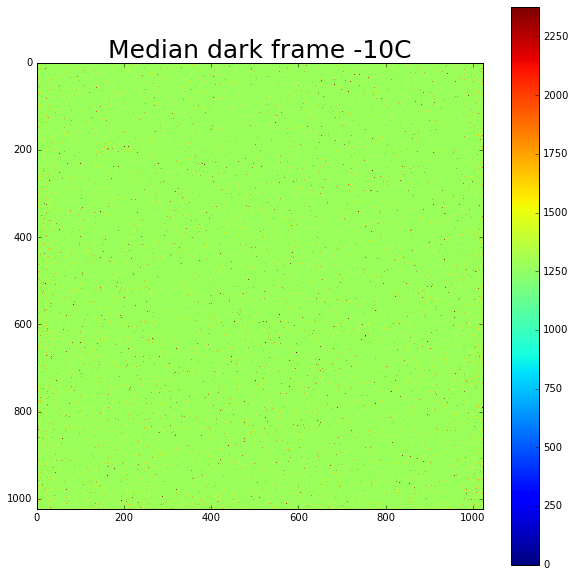

In [138]:
thefilt= 'I'                                                

flat_time=5
dark_time=100


median_dark=median_combine(dark_filenames[:][np.where((dark_exptimes==dark_time))])

median_flat=median_combine(flat_filenames[np.where((flat_filter_names==thefilt) & 
                                                             (flat_exptimes==flat_time))])
median_bias=median_combine(bias_filenames[:50])   # note that I take only the first 50 biases, to save time


print median_flat

plt.figure(figsize=(10,10))
plt.imshow(median_flat,vmax=np.median(median_flat)+3*np.std(median_flat))
plt.title('Median flat - '+thefilt,fontsize=25)
plt.colorbar()

plt.figure(figsize=(10,10))
plt.imshow(median_bias,vmax=np.median(median_bias)+3*np.std(median_bias))
plt.title('Median bias frame',fontsize=25)
plt.colorbar()

plt.figure(figsize=(10,10))
plt.imshow(median_dark,vmax=np.median(median_dark)+3*np.std(median_dark))
plt.title('Median dark frame -10C',fontsize=25)
plt.colorbar()

[ '/Users/noahknoblauch/PHY157/Observing/2016-Spring_157/20160526/M51/I_band.00000002.M_51.FIT'
 '/Users/noahknoblauch/PHY157/Observing/2016-Spring_157/20160526/M51/I_band.00000003.M_51.FIT'
 '/Users/noahknoblauch/PHY157/Observing/2016-Spring_157/20160526/M51/I_band.00000004.M_51.FIT'
 '/Users/noahknoblauch/PHY157/Observing/2016-Spring_157/20160526/M51/I_band.00000005.M_51.FIT'
 '/Users/noahknoblauch/PHY157/Observing/2016-Spring_157/20160526/M51/I_band.00000006.M_51.FIT'
 '/Users/noahknoblauch/PHY157/Observing/2016-Spring_157/20160526/M51/I_band.00000007.M_51.FIT'
 '/Users/noahknoblauch/PHY157/Observing/2016-Spring_157/20160526/M51/I_band.00000008.M_51.FIT'
 '/Users/noahknoblauch/PHY157/Observing/2016-Spring_157/20160526/M51/I_band.00000009.M_51.FIT'
 '/Users/noahknoblauch/PHY157/Observing/2016-Spring_157/20160526/M51/I_band.00000010.M_51.FIT'
 '/Users/noahknoblauch/PHY157/Observing/2016-Spring_157/20160526/M51/I_band.00000011.M_51.FIT'
 '/Users/noahknoblauch/PHY157/Observing/2016-Spri

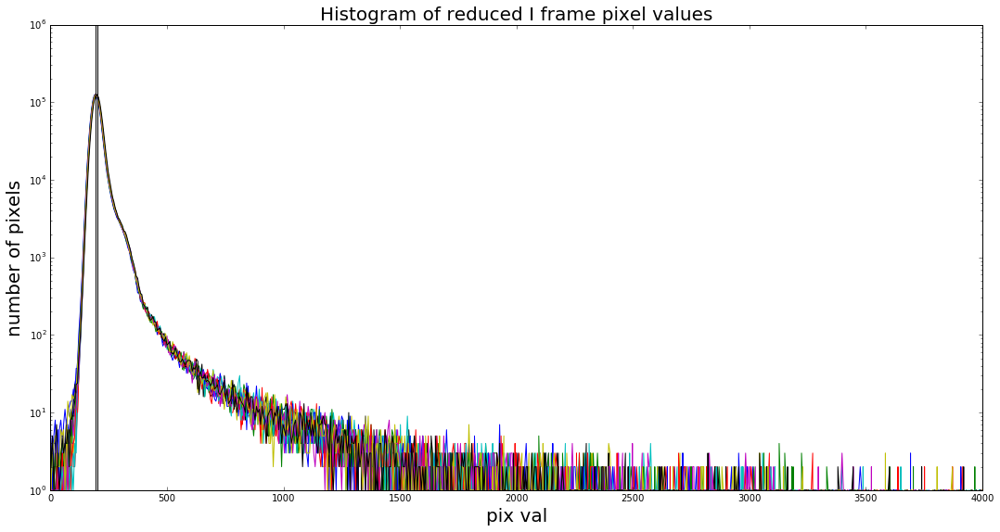

In [143]:
m51_time=100
science_filenames=np.sort(m51_filenames[np.where((m51_filter_names==thefilt) & (m51_exptimes==m51_time))])[1:]
science_filenames=science_filenames
print science_filenames
science_reduced = reduce_raw_science_frames(science_filenames,median_bias,median_flat,median_dark)
science_exptimes=np.array([pyfits.getheader(fooname)["EXPTIME"] for fooname in science_filenames])
print science_exptimes
for i in range(len(science_reduced)):
    pyfits.writeto(science_filenames[i].split('.FIT')[0]+'-reduced.fits',science_reduced[i],
                   clobber=True,header=pyfits.getheader(science_filenames[i]))

plt.figure(figsize=(18,9))
skylevels=[]
for i in range(len(science_reduced)):
    numpix,aduvals=np.histogram(science_reduced[i].flatten(),bins=1000,range=[-1000,5e3])
    skylevel=aduvals[np.where(numpix==numpix.max())][0]
    skylevels.append(skylevel)
    plt.plot(aduvals[:-1],numpix)
    plt.axvline(skylevel,color='k')
plt.xlabel('pix val',fontsize=20)
plt.ylabel('number of pixels',fontsize=20)
plt.yscale('log')

plt.xlim(0,4000)

print skylevels
plt.title('Histogram of reduced I frame pixel values',fontsize=20)

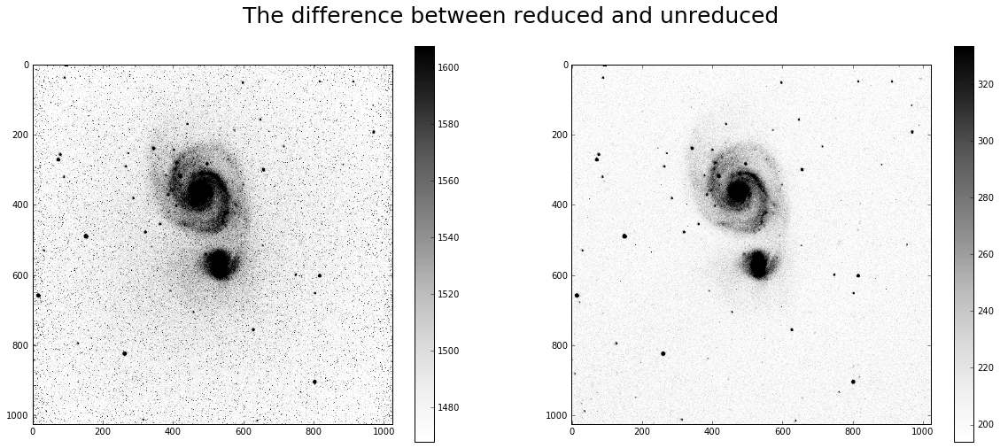

In [82]:
testnum=0
nstd=10
unreduced=pyfits.getdata(science_filenames[testnum])
plt.figure(figsize=(20,8))
plt.subplot(121)
vmin_unred=np.median(median_dark)+skylevels[testnum]
plt.imshow(unreduced,cmap='Greys',vmin=vmin_unred,vmax=vmin_unred+nstd*np.sqrt(skylevels[testnum]))
plt.colorbar()
plt.subplot(122)
plt.imshow(science_reduced[testnum],cmap='Greys',vmin=skylevels[testnum],vmax=skylevels[testnum]+nstd*np.sqrt(skylevels[testnum]))
plt.colorbar()
plt.suptitle('The difference between reduced and unreduced',fontsize=25)


86 objects found


[0, 1024, 0, 1024]

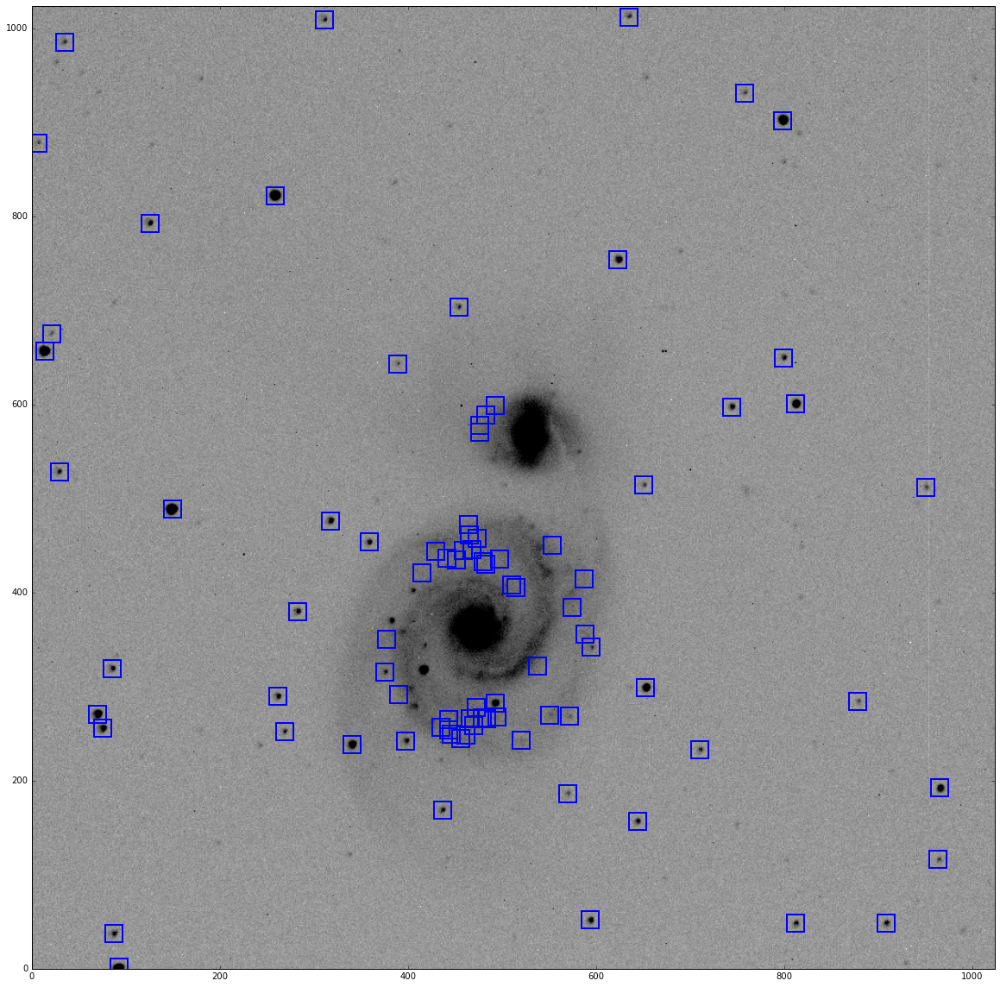

In [83]:
imgnum=1
nstd_aboveskynoise=5
threshold=skylevels[imgnum]+nstd_aboveskynoise*np.sqrt(skylevels[imgnum])   # decide on a threshold using the sky noise
minsize=3

xfoo,yfoo,xsfoo,ysfoo=find_object_centroids_filterbysize(science_reduced[imgnum],threshold,minsize)


plt.figure(figsize=(20,20))
plt.imshow(science_reduced[imgnum],cmap='Greys',vmin=0,vmax=1.5*threshold)
plt.plot(xfoo,yfoo,'rs',mfc='None',markersize=20,markeredgecolor='b',markeredgewidth=2)
plt.axis([0,1024,0,1024])

108 objects found
127 objects found
96 objects found
90 objects found
86 objects found
102 objects found
106 objects found
123 objects found
112 objects found
91 objects found
88 objects found
104 objects found
92 objects found
103 objects found


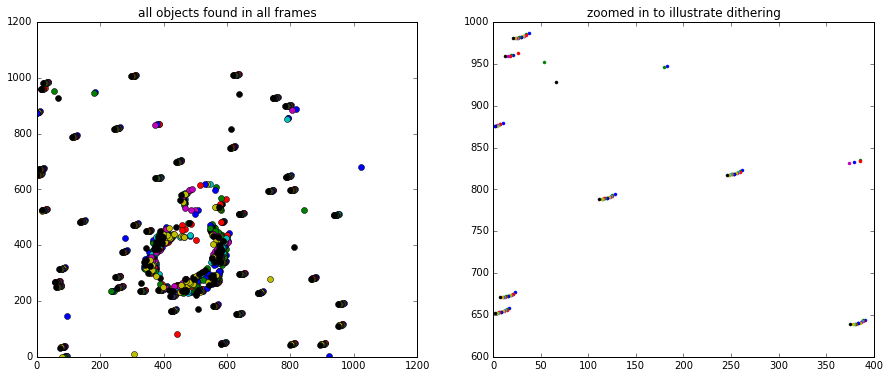

In [84]:
nstd_aboveskynoise=4
thresholds=skylevels+nstd_aboveskynoise*np.sqrt(skylevels)

#thresholds=[threshold]*len(science_reduced)
minsize=3
xc_all,yc_all,xs_all,ys_all=[],[],[],[]
plt.figure(figsize=(15,6))
for i in range(len(science_reduced)):
    xfoo,yfoo,xsfoo,ysfoo=find_object_centroids_filterbysize(science_reduced[i],thresholds[i],minsize)
    xc_all.append(xfoo)
    yc_all.append(yfoo)
    xs_all.append(xsfoo)
    ys_all.append(ysfoo)
    plt.subplot(121)
    plt.plot(xfoo,yfoo,'o')
    plt.subplot(122)
    plt.plot(xfoo,yfoo,'.')
    plt.axis([0,400,600,1000])
plt.subplot(121)
plt.title('all objects found in all frames')
plt.subplot(122)
plt.title('zoomed in to illustrate dithering')

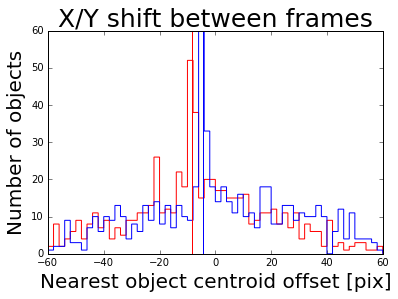

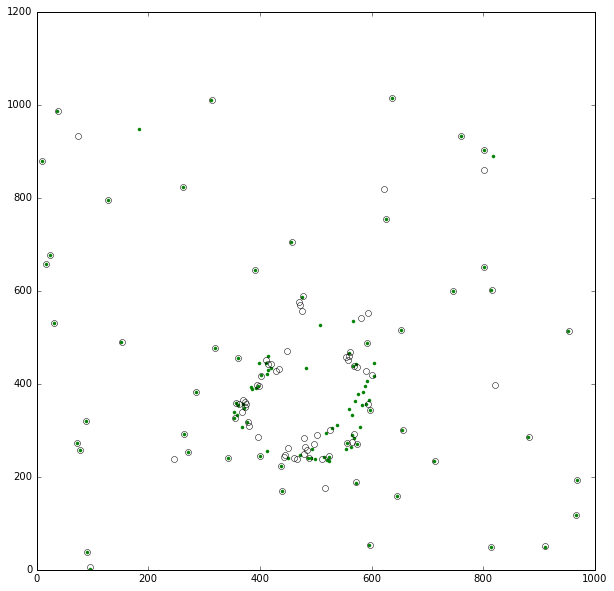

In [85]:
secondnum=6
dr=60
xc0,yc0,xc1,yc1=xc_all[0],yc_all[0],xc_all[secondnum],yc_all[secondnum]
xoff,yoff,xpeak,ypeak=find_closest(xc0,yc0,xc1,yc1,dr)
 
    
plt.hist(xoff,histtype='step',label='x offset',range=[-dr,dr],bins=dr,color='r')
plt.hist(yoff,histtype='step',label='y offset',range=[-dr,dr],bins=dr,color='b')

plt.axvline(xpeak,color='r')
plt.axvline(ypeak,color='b')

plt.xlabel('Nearest object centroid offset [pix]',fontsize=20)
plt.ylabel('Number of objects',fontsize=20)
plt.title('X/Y shift between frames',fontsize=25)

plt.figure(figsize=(10,10))
plt.plot(xc0,yc0,'g.')
plt.plot(xc1-xpeak,yc1-ypeak,'o',mfc='None')

60.0 -16.5 -5.5
30.0 -16.2656873636 -5.54049115549
20.0 -16.1697291575 -5.5178320278
15.0 -16.2244364496 -5.49283420699
12.0 -16.2244364496 -5.49912018468
10.0 -16.2096611561 -5.51015484833


(-16.209661156068307, -5.5101548483257261)

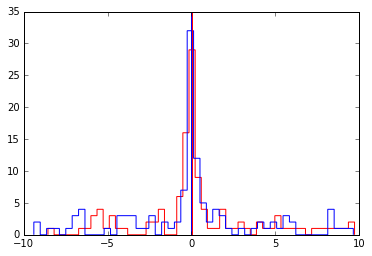

In [86]:
firstnum,secondnum=0,-1
dr=60
xc0,yc0,xc1,yc1=xc_all[firstnum],yc_all[firstnum],xc_all[secondnum],yc_all[secondnum]
find_frame_shifts(xc0,yc0,xc1,yc1,dr,6)

60.0 -2.5 -1.5
30.0 -2.4476952332 -1.28811285317
20.0 -2.39501746201 -1.29301016264
15.0 -2.40501993362 -1.27427066397
60.0 -2.5 -1.5
30.0 -2.39761641911 -1.81924069945
20.0 -2.42541248535 -1.85651134887
15.0 -2.48341987709 -1.86523447538
60.0 -4.5 -2.5
30.0 -4.20454051765 -2.37675776557
20.0 -4.20454051765 -2.35780133438
15.0 -4.23464328781 -2.35953104979
60.0 -5.5 -3.5
30.0 -5.0640275031 -3.17357460256
20.0 -5.14057172286 -3.13805862674
15.0 -5.18399031055 -3.12985919101
60.0 -5.5 -3.5
30.0 -5.87896297506 -3.62032995152
20.0 -5.85352661983 -3.69434557418
15.0 -5.9089757437 -3.70251913592
60.0 -8.5 -4.5
30.0 -8.13112985148 -4.18352868942
20.0 -8.12119912099 -4.14838097986
15.0 -8.12119912099 -4.13747353119
60.0 -8.5 -4.5
30.0 -8.25274388805 -4.29398874899
20.0 -8.18292153382 -4.27281353183
15.0 -8.16680861025 -4.27059495566
60.0 -10.5 -4.5
30.0 -10.377209165 -4.21879215139
20.0 -10.341718454 -4.30504844054
15.0 -10.3343679898 -4.386312511
60.0 -10.5 -4.5
30.0 -10.7666423399 -4.6111631

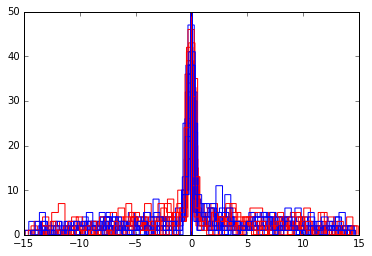

In [87]:
xshifts,yshifts=np.zeros(len(science_reduced)),np.zeros(len(science_reduced))
for secondnum in range(1,len(science_reduced)):
    xshifts[secondnum],yshifts[secondnum]=find_frame_shifts(xc_all[0],yc_all[0],xc_all[secondnum],yc_all[secondnum],dr,4)


In [88]:
science_shifted_rescaled=np.array([snd.interpolation.shift(science_reduced[i],[-yshifts[i],-xshifts[i]],order=5) for i in range(0,len(science_reduced))])
I_stackedimg=np.median(science_shifted_rescaled,axis=0)-np.median(skylevels)

//anaconda/lib/python2.7/site-packages/pyfits/file.py:372: UserWarning: Overwriting existing file '/Users/noahknoblauch/PHY157/Observing/2016-Spring_157/20160526/I-median.fits'.
  warnings.warn("Overwriting existing file %r." % self.name)


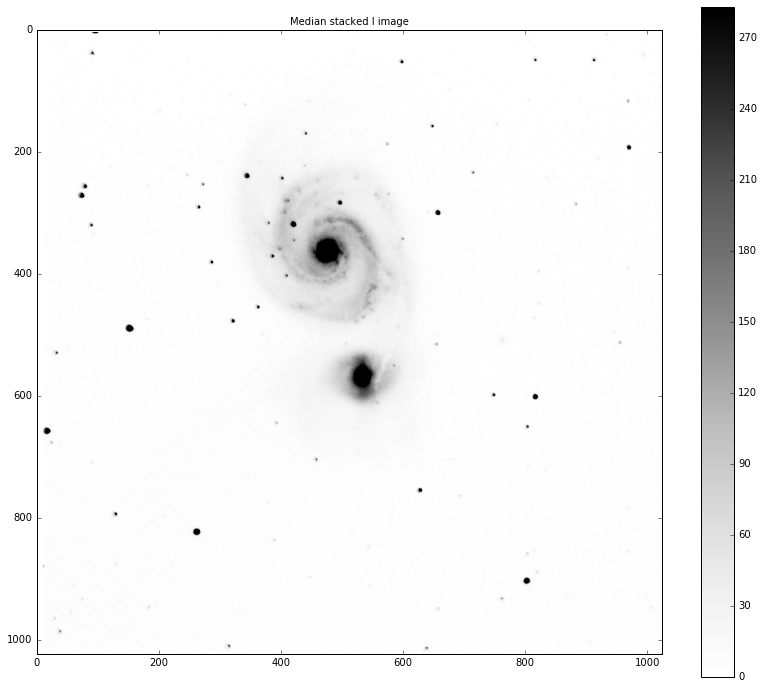

In [89]:
plt.figure(figsize=(14,12))
plt.title('Median stacked '+thefilt+' image',fontsize=10)
plt.imshow(I_stackedimg,cmap='Greys',vmin=0,vmax=20*np.sqrt(np.median(skylevels)))
plt.colorbar()
#plt.axis([200,700,200,700])
pyfits.writeto(rootdir+thefilt+'-median.fits',I_stackedimg,clobber=True)

[[ 21833.   21985.   22001.5 ...,  22344.5  22387.   21979.5]
 [ 24437.   24901.5  24844.5 ...,  25139.   25143.5  24803. ]
 [ 24418.   24770.5  24752.  ...,  25058.   25034.   24788. ]
 ..., 
 [ 23710.5  24096.5  23973.  ...,  24671.5  24408.5  24215.5]
 [ 23632.5  24130.5  24036.5 ...,  24591.5  24538.   24092. ]
 [ 23596.   23704.   23922.  ...,  24644.   24603.5  24052. ]]


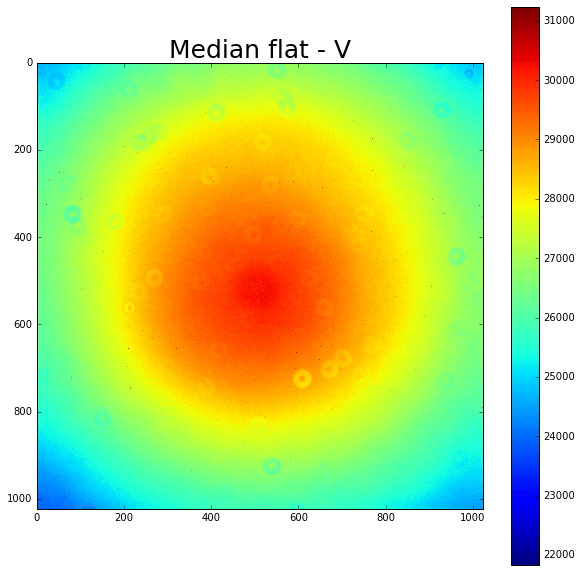

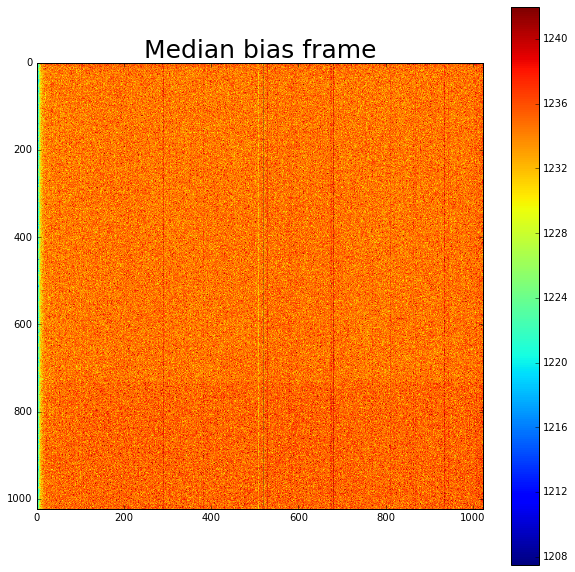

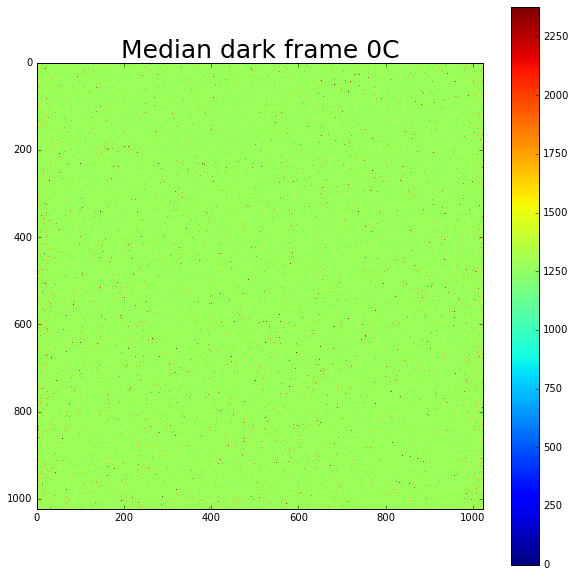

In [90]:
thefilt='V'
flat_time=15
dark_time=100


median_dark=median_combine(dark_filenames[:][np.where((dark_exptimes==dark_time))])

median_flat=median_combine(flat_filenames[np.where((flat_filter_names==thefilt) & 
                                                             (flat_exptimes==flat_time))])
median_bias=median_combine(bias_filenames[:50])   # note that I take only the first 50 biases, to save time

print median_flat


plt.figure(figsize=(10,10))
plt.imshow(median_flat,vmax=np.median(median_flat)+3*np.std(median_flat))
plt.title('Median flat - '+thefilt,fontsize=25)
plt.colorbar()

plt.figure(figsize=(10,10))
plt.imshow(median_bias,vmax=np.median(median_bias)+3*np.std(median_bias))
plt.title('Median bias frame',fontsize=25)
plt.colorbar()

plt.figure(figsize=(10,10))
plt.imshow(median_dark,vmax=np.median(median_dark)+3*np.std(median_dark))
plt.title('Median dark frame 0C',fontsize=25)
plt.colorbar()


[ '/Users/noahknoblauch/PHY157/Observing/2016-Spring_157/20160526/M51/V_band.00000002.M_51.FIT'
 '/Users/noahknoblauch/PHY157/Observing/2016-Spring_157/20160526/M51/V_band.00000003.M_51.FIT'
 '/Users/noahknoblauch/PHY157/Observing/2016-Spring_157/20160526/M51/V_band.00000004.M_51.FIT'
 '/Users/noahknoblauch/PHY157/Observing/2016-Spring_157/20160526/M51/V_band.00000005.M_51.FIT'
 '/Users/noahknoblauch/PHY157/Observing/2016-Spring_157/20160526/M51/V_band.00000006.M_51.FIT'
 '/Users/noahknoblauch/PHY157/Observing/2016-Spring_157/20160526/M51/V_band.00000007.M_51.FIT'
 '/Users/noahknoblauch/PHY157/Observing/2016-Spring_157/20160526/M51/V_band.00000008.M_51.FIT'
 '/Users/noahknoblauch/PHY157/Observing/2016-Spring_157/20160526/M51/V_band.00000009.M_51.FIT'
 '/Users/noahknoblauch/PHY157/Observing/2016-Spring_157/20160526/M51/V_band.00000010.M_51.FIT'
 '/Users/noahknoblauch/PHY157/Observing/2016-Spring_157/20160526/M51/V_band.00000011.M_51.FIT'
 '/Users/noahknoblauch/PHY157/Observing/2016-Spri

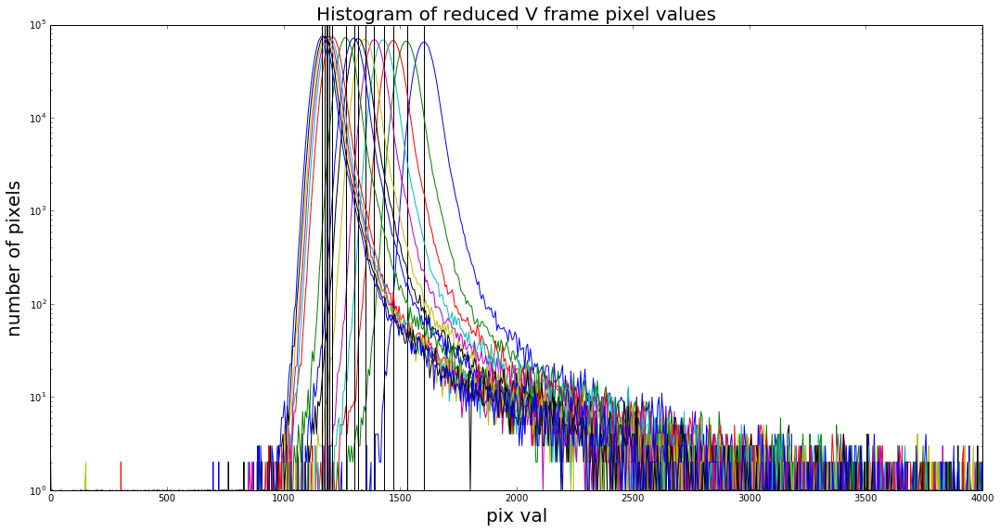

In [91]:
m51_time=100
science_filenames=np.sort(m51_filenames[np.where((m51_filter_names==thefilt) & (m51_exptimes==m51_time))])[1:]
science_filenames=science_filenames
print science_filenames
science_reduced = reduce_raw_science_frames(science_filenames,median_bias,median_flat,median_dark)
science_exptimes=np.array([pyfits.getheader(fooname)["EXPTIME"] for fooname in science_filenames])
print science_exptimes
for i in range(len(science_reduced)):
    pyfits.writeto(science_filenames[i].split('.FIT')[0]+'-reduced.fits',science_reduced[i],
                   clobber=True,header=pyfits.getheader(science_filenames[i]))

plt.figure(figsize=(18,9))
skylevels=[]
for i in range(len(science_reduced)):
    numpix,aduvals=np.histogram(science_reduced[i].flatten(),bins=1000,range=[-1000,5e3])
    skylevel=aduvals[np.where(numpix==numpix.max())][0]
    skylevels.append(skylevel)
    plt.plot(aduvals[:-1],numpix)
    plt.axvline(skylevel,color='k')
plt.xlabel('pix val',fontsize=20)
plt.ylabel('number of pixels',fontsize=20)
plt.yscale('log')

plt.xlim(0,4000)

print skylevels
plt.title('Histogram of reduced V frame pixel values',fontsize=20)

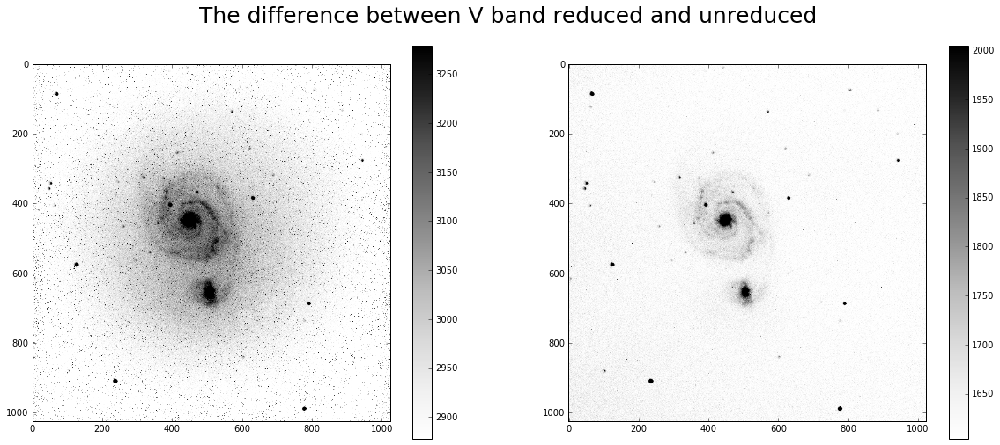

In [92]:
testnum=0
nstd=10
unreduced=pyfits.getdata(science_filenames[testnum])
plt.figure(figsize=(20,8))
plt.subplot(121)
vmin_unred=np.median(median_dark)+skylevels[testnum]
plt.imshow(unreduced,cmap='Greys',vmin=vmin_unred,vmax=vmin_unred+nstd*np.sqrt(skylevels[testnum]))
plt.colorbar()
plt.subplot(122)
plt.imshow(science_reduced[testnum],cmap='Greys',vmin=skylevels[testnum],vmax=skylevels[testnum]+nstd*np.sqrt(skylevels[testnum]))
plt.colorbar()
plt.suptitle('The difference between V band reduced and unreduced',fontsize=25)


24 objects found


[0, 1024, 0, 1024]

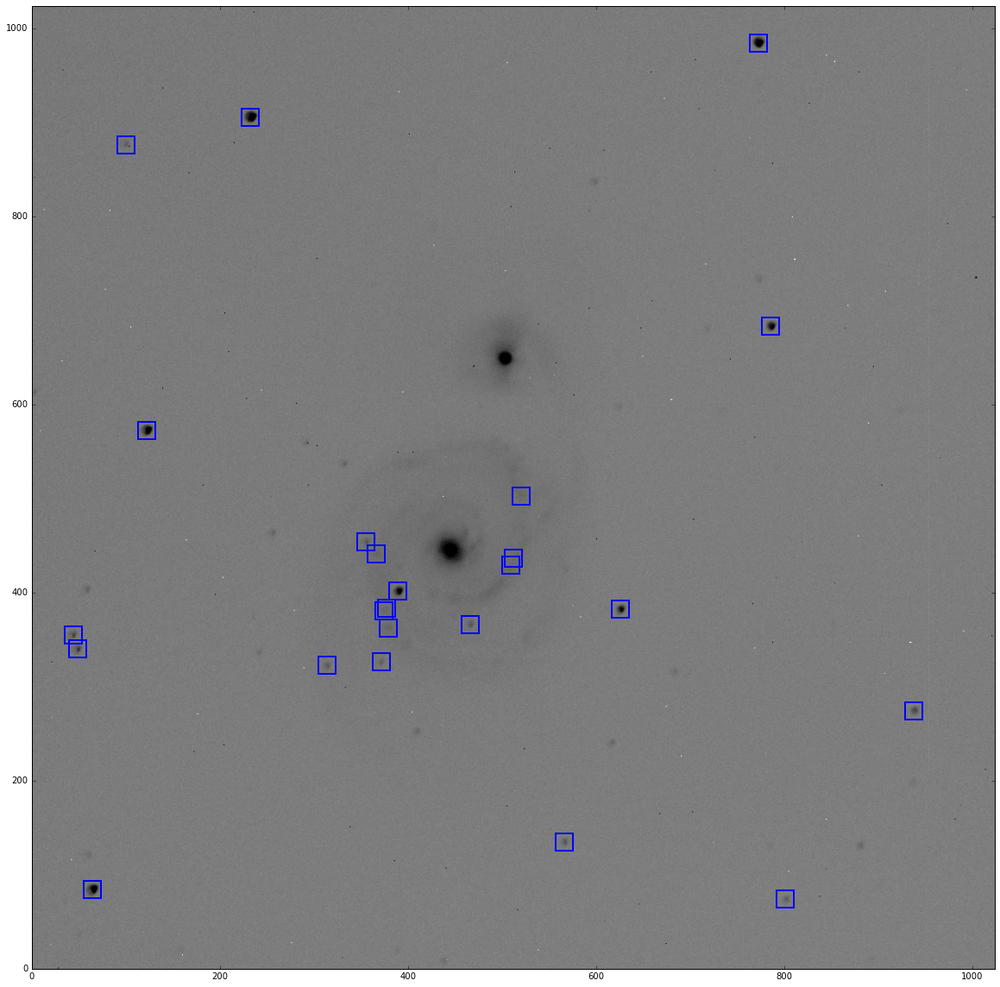

In [93]:
imgnum=1
nstd_aboveskynoise=5
threshold=skylevels[imgnum]+nstd_aboveskynoise*np.sqrt(skylevels[imgnum])   # decide on a threshold using the sky noise
minsize=3

xfoo,yfoo,xsfoo,ysfoo=find_object_centroids_filterbysize(science_reduced[imgnum],threshold,minsize)


plt.figure(figsize=(20,20))
plt.imshow(science_reduced[imgnum],cmap='Greys',vmin=0,vmax=1.5*threshold)
plt.plot(xfoo,yfoo,'rs',mfc='None',markersize=20,markeredgecolor='b',markeredgewidth=2)
plt.axis([0,1024,0,1024])

51 objects found
43 objects found
53 objects found
50 objects found
56 objects found
51 objects found
61 objects found
52 objects found
75 objects found
71 objects found
62 objects found
77 objects found
76 objects found
66 objects found
72 objects found


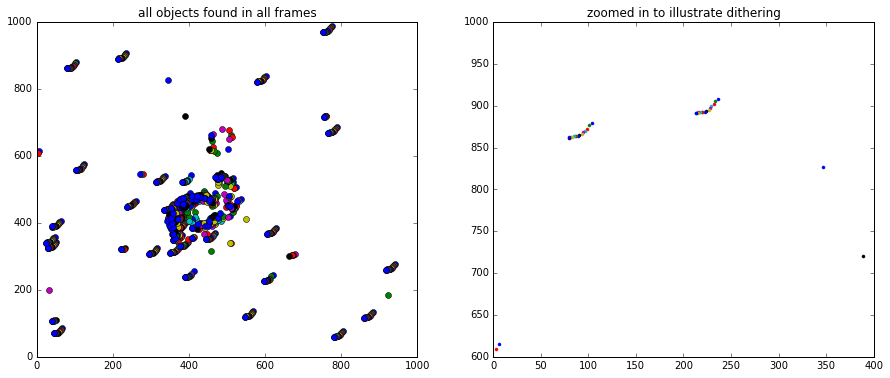

In [94]:
nstd_aboveskynoise=4
thresholds=skylevels+nstd_aboveskynoise*np.sqrt(skylevels)

#thresholds=[threshold]*len(science_reduced)
minsize=3
xc_all,yc_all,xs_all,ys_all=[],[],[],[]
plt.figure(figsize=(15,6))
for i in range(len(science_reduced)):
    xfoo,yfoo,xsfoo,ysfoo=find_object_centroids_filterbysize(science_reduced[i],thresholds[i],minsize)
    xc_all.append(xfoo)
    yc_all.append(yfoo)
    xs_all.append(xsfoo)
    ys_all.append(ysfoo)
    plt.subplot(121)
    plt.plot(xfoo,yfoo,'o')
    plt.subplot(122)
    plt.plot(xfoo,yfoo,'.')
    plt.axis([0,400,600,1000])
plt.subplot(121)
plt.title('all objects found in all frames')
plt.subplot(122)
plt.title('zoomed in to illustrate dithering')

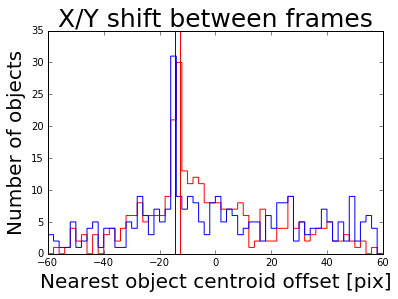

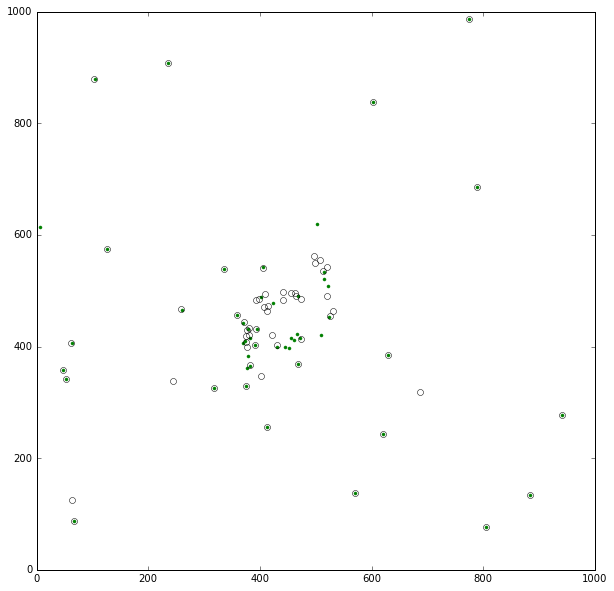

In [95]:
secondnum=6
dr=60
xc0,yc0,xc1,yc1=xc_all[0],yc_all[0],xc_all[secondnum],yc_all[secondnum]
xoff,yoff,xpeak,ypeak=find_closest(xc0,yc0,xc1,yc1,dr)
 
    
plt.hist(xoff,histtype='step',label='x offset',range=[-dr,dr],bins=dr,color='r')
plt.hist(yoff,histtype='step',label='y offset',range=[-dr,dr],bins=dr,color='b')

plt.axvline(xpeak,color='r')
plt.axvline(ypeak,color='b')

plt.xlabel('Nearest object centroid offset [pix]',fontsize=20)
plt.ylabel('Number of objects',fontsize=20)
plt.title('X/Y shift between frames',fontsize=25)

plt.figure(figsize=(10,10))
plt.plot(xc0,yc0,'g.')
plt.plot(xc1-xpeak,yc1-ypeak,'o',mfc='None')

60.0 -23.5 -17.5
30.0 -23.0817328016 -17.4487611552
20.0 -22.8590387748 -17.4901591977
15.0 -22.8203470388 -17.4694601765
12.0 -22.8590387748 -17.4460309372
10.0 -22.9582444318 -17.3695256696


(-22.958244431763347, -17.369525669625801)

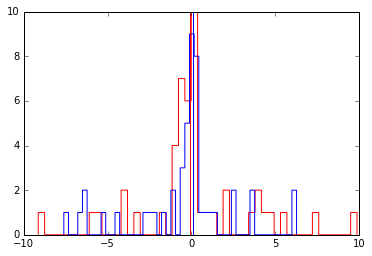

In [96]:
firstnum,secondnum=0,-1
dr=60
xc0,yc0,xc1,yc1=xc_all[firstnum],yc_all[firstnum],xc_all[secondnum],yc_all[secondnum]
find_frame_shifts(xc0,yc0,xc1,yc1,dr,6)

60.0 -3.5 -2.5
30.0 -3.20628394219 -2.58222264957
20.0 -3.21416827773 -2.55839728981
15.0 -3.21416827773 -2.58222264957
60.0 -4.5 -6.5
30.0 -4.22257546112 -6.45563068939
20.0 -4.24032092761 -6.39713108711
15.0 -4.22257546112 -6.42590925449
60.0 -6.5 -9.5
30.0 -6.86158971434 -9.14812767053
20.0 -6.84299527625 -9.00003575518
15.0 -6.98832849888 -8.98954206433
60.0 -8.5 -11.5
30.0 -8.35522528954 -11.413066172
20.0 -8.40306206992 -11.3916102177
15.0 -8.40185699781 -11.3998748558
60.0 -9.5 -12.5
30.0 -9.59417298409 -12.8675261243
20.0 -9.54033737095 -12.9032855143
15.0 -9.49728614797 -12.8675261243
60.0 -12.5 -14.5
30.0 -12.5285018899 -14.5217011337
20.0 -12.55199373 -14.365738943
15.0 -12.5120928574 -14.3276721017
60.0 -13.5 -15.5
30.0 -13.3521997557 -15.0830173856
20.0 -13.4228795612 -15.0492823697
15.0 -13.440828117 -15.106186772
60.0 -16.5 -15.5
30.0 -16.5696461536 -15.6989484315
20.0 -16.4881088301 -15.8161149667
15.0 -16.5289301896 -15.8517569231
60.0 -17.5 -15.5
30.0 -17.1743222061 -

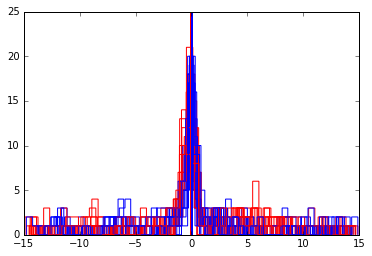

In [97]:
xshifts,yshifts=np.zeros(len(science_reduced)),np.zeros(len(science_reduced))
for secondnum in range(1,len(science_reduced)):
    xshifts[secondnum],yshifts[secondnum]=find_frame_shifts(xc_all[0],yc_all[0],xc_all[secondnum],yc_all[secondnum],dr,4)


In [98]:
science_shifted_rescaled=np.array([snd.interpolation.shift(science_reduced[i],[-yshifts[i],-xshifts[i]],order=5) for i in range(0,len(science_reduced))])
V_stackedimg=np.median(science_shifted_rescaled,axis=0)-np.median(skylevels)

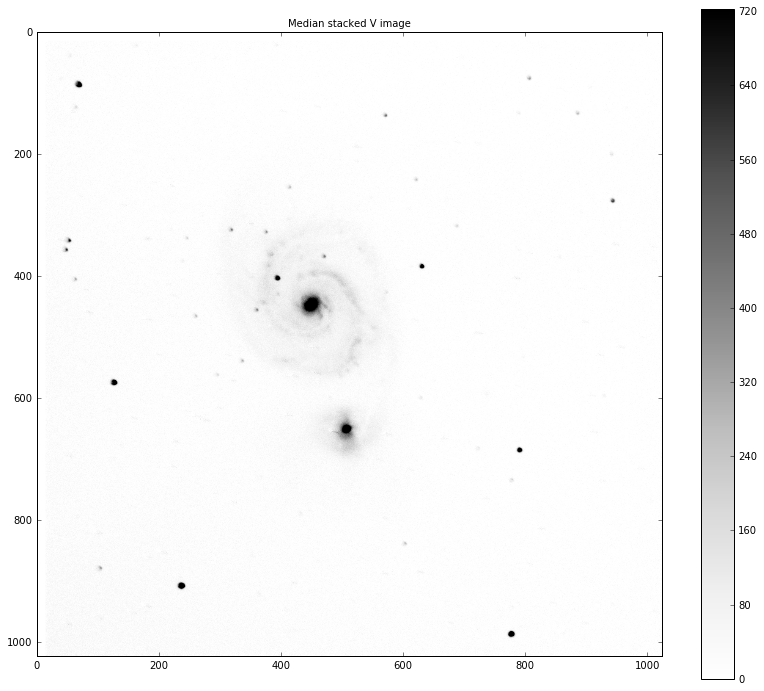

In [59]:
plt.figure(figsize=(14,12))
plt.title('Median stacked '+thefilt+' image',fontsize=10)
plt.imshow(V_stackedimg,cmap='Greys',vmin=0,vmax=20*np.sqrt(np.median(skylevels)))
plt.colorbar()
#plt.axis([200,700,200,700])
pyfits.writeto(rootdir+thefilt+'-median.fits',V_stackedimg,clobber=True)

16 objects found
27 objects found
15 objects found


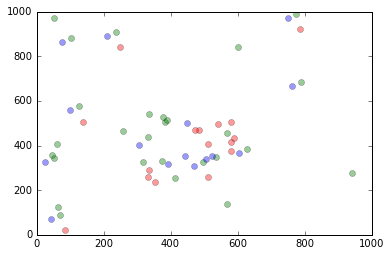

In [144]:
rimg=pyfits.getdata('/Users/noahknoblauch/PHY157/Observing/Ha_staked_img.FITS')

nstd_aboveskynoise=10
minsize=8
skylevel_r,skylevel_g,skylevel_b=np.median(rimg[rimg>0]),np.median(V_stackedimg[V_stackedimg>0]),np.median(B_stackedimg[B_stackedimg>0])

xr,yr,xsfoo,ysfoo=find_object_centroids_filterbysize(rimg,skylevel_r+nstd_aboveskynoise*np.sqrt(skylevel_r),minsize)
xg,yg,xsfoo,ysfoo=find_object_centroids_filterbysize(V_stackedimg,skylevel_g+nstd_aboveskynoise*np.sqrt(skylevel_g),minsize)
xb,yb,xsfoo,ysfoo=find_object_centroids_filterbysize(B_stackedimg,skylevel_b+nstd_aboveskynoise*np.sqrt(skylevel_b),minsize)


plt.plot(xr,yr,'ro',alpha=.4)
plt.plot(xg,yg,'go',alpha=.4)
plt.plot(xb,yb,'bo',alpha=.4)

200.0 25.5 17.5


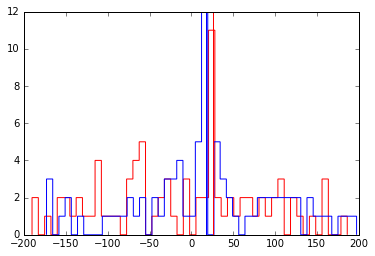

In [153]:
dr=200
x_off_bg,y_off_bg=find_frame_shifts(xb,yb,xg,yg,dr,1)

In [154]:
g_shifted=snd.interpolation.shift(V_stackedimg,[-y_off_bg,-x_off_bg],order=5)
r_shifted=snd.interpolation.shift(rimg,[-y_off_b1,-x_off_b1],order=5)


17 objects found


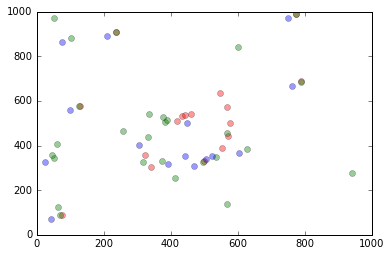

In [159]:
xr1,yr1,xsfoo,ysfoo=find_object_centroids_filterbysize(r_shifted,skylevel_r+nstd_aboveskynoise*np.sqrt(skylevel_r),minsize)
plt.plot(xr1,yr1,'ro',alpha=.4)
plt.plot(xg,yg,'go',alpha=.4)
plt.plot(xb,yb,'bo',alpha=.4)

200.0 10.5 -67.5


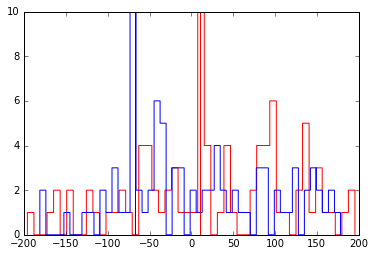

In [162]:
dr=200
x_off_br1,y_off_br1=find_frame_shifts(xg,yg,xr,yr,dr,1)

In [166]:
r_shifted1=snd.interpolation.shift(r_shifted,[y_off_br1,x_off_br1],order=5)


13 objects found


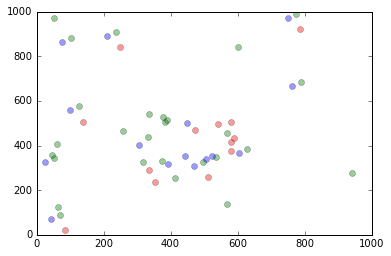

In [151]:
def scalesqrt(inputArray, scale_min=None, scale_max=None):
    """Performs sqrt scaling of the input numpy array."""

    imageData=np.array(inputArray, copy=True)

    imageData = imageData.clip(min=scale_min, max=scale_max)
    imageData = imageData - scale_min
    indices = np.where(imageData < 0)
    imageData[indices] = 0.0
    imageData = np.sqrt(imageData)
    imageData = imageData / np.sqrt(scale_max - scale_min)

    return imageData

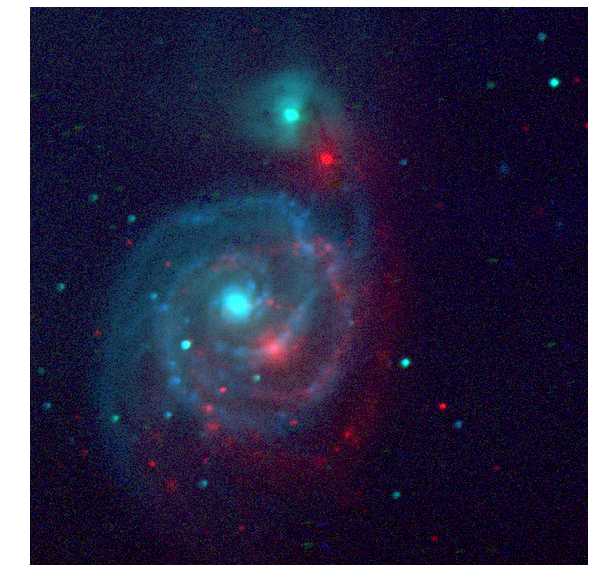

In [167]:
rgbstack=[r_shifted1,g_shifted,B_stackedimg]
nstd=10    # number of standard deviations above sky noise to call an RGB pixel=255
rgbimg=np.zeros((1024,1024,3))

for i in range(3):
    onecolor=rgbstack[i]
    colorstd,colormed=np.std(onecolor[onecolor>10]),np.median(onecolor[onecolor>10])
    scale_min,scale_max=0,colormed+nstd*colorstd
    rgbimg[:,:,i]=scalesqrt(onecolor, scale_min=scale_min, scale_max=scale_max)

    
plt.figure(figsize=(10,10))
plt.imshow(rgbimg,interpolation='None')
plt.axis([200,800,150,750])
plt.axis('off')
plt.savefig('Coolshit.jpg')

16 objects found
27 objects found
15 objects found


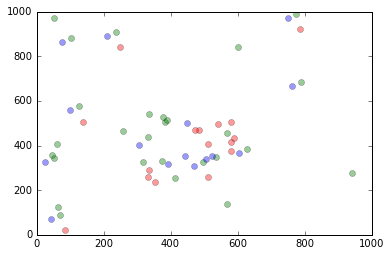

In [170]:
nstd_aboveskynoise=10
minsize=8
skylevel_r,skylevel_g,skylevel_b=np.median(rimg[rimg>0]),np.median(V_stackedimg[V_stackedimg>0]),np.median(B_stackedimg[B_stackedimg>0])

xr,yr,xsfoo,ysfoo=find_object_centroids_filterbysize(rimg,skylevel_r+nstd_aboveskynoise*np.sqrt(skylevel_r),minsize)
xg,yg,xsfoo,ysfoo=find_object_centroids_filterbysize(V_stackedimg,skylevel_g+nstd_aboveskynoise*np.sqrt(skylevel_g),minsize)
xb,yb,xsfoo,ysfoo=find_object_centroids_filterbysize(B_stackedimg,skylevel_b+nstd_aboveskynoise*np.sqrt(skylevel_b),minsize)


plt.plot(xr,yr,'ro',alpha=.4)
plt.plot(xg,yg,'go',alpha=.4)
plt.plot(xb,yb,'bo',alpha=.4)

200.0 25.5 17.5


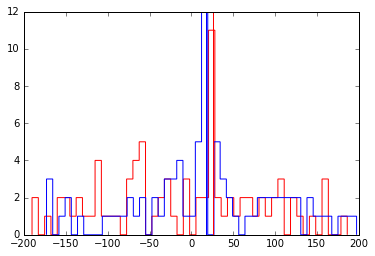

In [176]:
dr=200
x_off_bg,y_off_bg=find_frame_shifts(xb,yb,xg,yg,dr,1)

200.0 -10.5 38.5


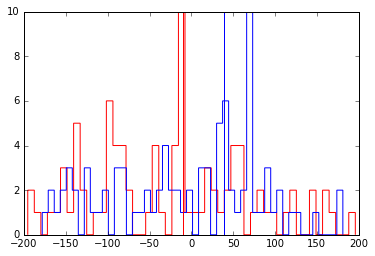

In [175]:
dr=200
r_x_off_bg,r_y_off_bg=find_frame_shifts(xr,yr,xg,yg,dr,1)

In [188]:
g_shifted=snd.interpolation.shift(V_stackedimg,[-y_off_bg,-x_off_bg],order=5)
r_shifted=snd.interpolation.shift(rimg,[r_y_off_bg,r_x_off_bg],order=5)


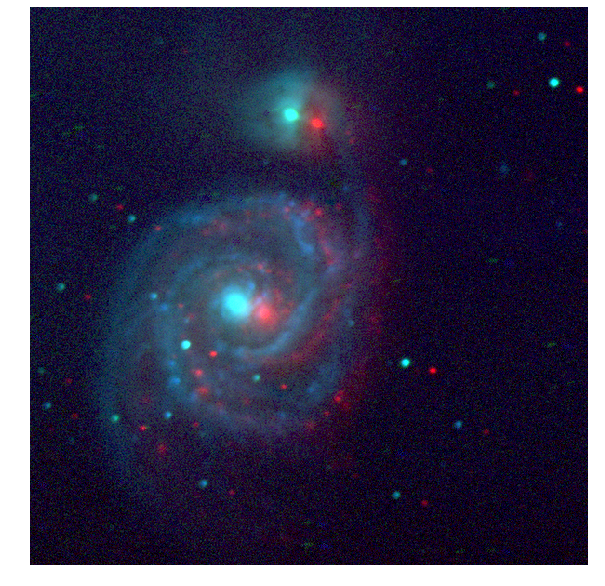

In [189]:
rgbstack=[r_shifted,g_shifted,B_stackedimg]
nstd=10    # number of standard deviations above sky noise to call an RGB pixel=255
rgbimg=np.zeros((1024,1024,3))

for i in range(3):
    onecolor=rgbstack[i]
    colorstd,colormed=np.std(onecolor[onecolor>10]),np.median(onecolor[onecolor>10])
    scale_min,scale_max=0,colormed+nstd*colorstd
    rgbimg[:,:,i]=scalesqrt(onecolor, scale_min=scale_min, scale_max=scale_max)

    
plt.figure(figsize=(10,10))
plt.imshow(rgbimg,interpolation='None')
plt.axis([200,800,150,750])
plt.axis('off')
plt.savefig('Coolshit.jpg')

17 objects found
200.0 -183.5 25.5


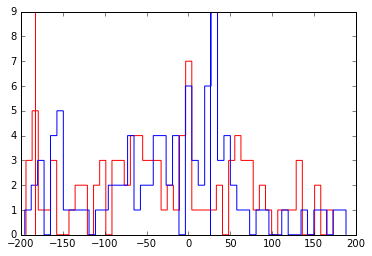

In [194]:
xr1,yr1,xsfoo,ysfoo=find_object_centroids_filterbysize(r_shifted,skylevel_r+nstd_aboveskynoise*np.sqrt(skylevel_r),minsize)
dr=200
r_x_off_bg,r_y_off_bg=find_frame_shifts(xr1,yr1,xg,yg,dr,1)

In [226]:
r_shifted1=snd.interpolation.shift(r_shifted,[10,-27],order=5)

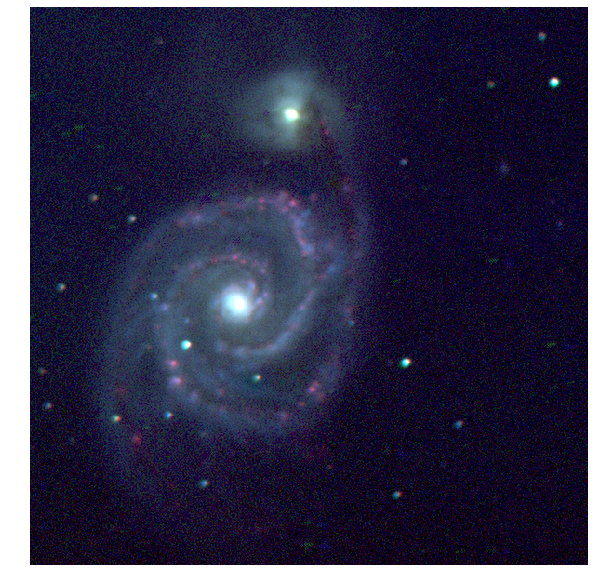

In [227]:
rgbstack=[r_shifted1,g_shifted,B_stackedimg]
nstd=10    # number of standard deviations above sky noise to call an RGB pixel=255
rgbimg=np.zeros((1024,1024,3))

for i in range(3):
    onecolor=rgbstack[i]
    colorstd,colormed=np.std(onecolor[onecolor>10]),np.median(onecolor[onecolor>10])
    scale_min,scale_max=0,colormed+nstd*colorstd
    rgbimg[:,:,i]=scalesqrt(onecolor, scale_min=scale_min, scale_max=scale_max)

    
plt.figure(figsize=(10,10))
plt.imshow(rgbimg,interpolation='None')
plt.axis([200,800,150,750])
plt.axis('off')
plt.savefig('Coolshit.jpg')